In [1]:
import pandas as pd
import re
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import json
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
from plotly import graph_objects as go


<div class="alert alert-info"> 
<b>Комментарий студента_V1</b> 
    
Исправил неработающий код [вот тут](#first_review). Никакие другие комментарии пока не трогал.
</div>

<a id='home'></a>
# Оглавление 
1. [Шаг 1. Загрузите данные и изучите общую информацию](#first_step)
2. [Шаг 2. Выполните предобработку данных](#second_step)
3. [Шаг 3. Анализ данных](#third_step)
4. [Шаг 4. Детализируем исследование: открытие кофейни](#fourth_step)
5. [Шаг 5. Подготовка презентации](#fifth_step)

# Описание проекта
Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены. </br>
Для начала они просят вас — аналитика — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.</br>
Постарайтесь сделать презентацию информативной и лаконичной. Её структура и оформление сильно влияют на восприятие информации читателями вашего исследования. Выбирать инструменты (matplotlib, seaborn и другие) и типы визуализаций вы можете самостоятельно.</br>
Вам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

<div class="alert alert-info"> 
<b>Комментарий студента_V2</b> 
    
Цель исследования: </br>
    1. Исследовать рынок общественного питания Москвы, найти особенности и презентовать полученные результаты, которые помогут в выборе подходящего инвесторам места. </br>
    2. Исследовать категорию 'кофейня', дать рекомендации для размещения заведения в Москве.</br>

Ход исследования:</br>
    1. Загрузить данные и изучить общую информацию. Данные взяты из сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года.</br>
    2. Предобработать данные, избавиться от явных и неявных дубликатов, привести столбцы к нужным типам данных, решить что делать с пропусками(оставлять/удалять строки с пропусками/заполнять).</br>
    3. Анализ данных. Посмотреть сколько всего заведений, разбить по категориям, изучить цены, местоположение. Также рассмотреть всё в разбивке по административным округам Москвы.</br>
    4. Сделать то же, что и в 3 пункте, но только с категорией 'кофейня'.</br>
    5. Написать вывод.</br>
</div>

<a id="first_step"></a> 
# Шаг 1. Загрузите данные и изучите общую информацию.</br>
## Загрузите данные о заведениях общественного питания Москвы. Изучите общую информацию о датасете. Сколько заведений представлено? Что можно сказать о каждом столбце? Значения какого типа они хранят? 

In [2]:
try:
    df = pd.read_csv(r'C:\all\Study\Practicum\Module_3\moscow_places.csv')
except:
    df = pd.read_csv('/datasets/moscow_places.csv')
df.info()
df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


8406 строк, 8406 заведения(пока не было проверки на дубликаты). Удивляет странный формат столбца 'avg_bill'

[Обратно к Оглавлению](#home)
<a id='second_step'></a>
# Шаг 2. Выполните предобработку данных

## Изучите, есть ли дубликаты в данных. Поищите пропуски: встречаются ли они, в каких столбцах? Можно ли их обработать или оставить как есть?

In [3]:
df['name'] = df['name'].str.lower()
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [4]:
df.duplicated().sum()

0

Явных дубликатов нет.

Поиск неявных дубликатов буду делать так: Сгруппирую по названию заведения и его адресу.

In [5]:
duplic = df.pivot_table(index=['name','address'],values='chain',aggfunc='count').query('chain > 1')
duplic = duplic.reset_index()
duplic_name = duplic['name']
duplic_address = duplic['address']

In [6]:
df.query('name in @duplic_name and address in @duplic_address')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1430,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2211,раковарня клешни и хвосты,ресторан,"Москва, проспект Мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0
2420,раковарня клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3091,хлеб да выпечка,булочная,"Москва, Ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0
3109,хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


Неявные дубликаты, хотя у двух заведений отличаются географические координаты, а адрес указан один и тот же. Всё же удалю 3 строки.

In [7]:
df = df.query('index not in [1430,2211,3109]')

Пропуски

In [8]:
df.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 535
lat                     0
lng                     0
rating                  0
price                5088
avg_bill             4587
middle_avg_bill      5254
middle_coffee_cup    7868
chain                   0
seats                3611
dtype: int64

In [9]:
pd.DataFrame(round(df.isna().mean()*100,1)).style.background_gradient('coolwarm')

,0
name,0.000000
category,0.000000
address,0.000000
district,0.000000
hours,6.400000
lat,0.000000
lng,0.000000
rating,0.000000
price,60.500000
avg_bill,54.600000


<div class="alert alert-info"> 
<b>Комментарий студента_V2</b> 
    
 Действительно удобно так смотреть.
</div>

Проверю, есть ли пропуски в столбцах 'middle_avg_bill' и 'middle_coffee_cup', при условии, что столбец 'avg_bill' заполнен и начинается со слов 'Cредний' и 'Цена чашки'. Если такие пропуски будут, то их можно будет заполнить.

In [10]:
df[df['avg_bill'].str.contains('Средний',na=False) & df['middle_avg_bill'].isna()]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


In [11]:
df[df['avg_bill'].str.contains('Цена чашки',na=False) & df['middle_coffee_cup'].isna()]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


В теории, можно заполнить часть пропусков в столбце price, если в этой же строке есть информация в столбце avg_bill, также можно было восстановить avg_bill, при условии, что есть значение в столбце price, но я не уверен, что в этом много смысла, поэтому оставлю пропуски как есть.
Столбец seats можно заполнить медианой, группируя по категории, но 40% данных пропущено, так что не буду заменять, это может сильно исказить данные.

Создайте столбец street с названиями улиц из столбца с адресом.

In [12]:
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [13]:
def spliting(street):
    row = street.split()
    needed = []
    for i in row:
        if i[0].istitle():
            if len(i) > 3:
                needed.append(i)
    abc = " ".join(needed)
    abc = re.sub('[,]|Москва',"",abc)
    return abc


In [14]:
df['street'] = df['address'].apply(spliting)


In [15]:
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,Дыбенко
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,Дыбенко
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,Маршала Федоренко
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная


In [16]:
#Код ревьюера
df.query('street == "Клязьминская улица"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street


In [17]:
df['street'] = df['street'].apply(lambda x: x.strip())

<div class="alert alert-info"> 
<b>Комментарий студента_V2</b> 
    
Сделано. </br>
Столбец street не содержит никаких слов кроме названий(слова с большой буквы). Насколько это норм?
</div>

Создайте столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):

In [18]:
def open_time(hours):
    string = re.search('круглосуточно', str(hours))
    if string:
        string2 = re.search('ежедневно', str(hours))
        if string2:
            return True
        else:
            return False
    else:
        return False

In [19]:
df['is24_7'] = df['hours'].apply(open_time)

Узнал что такое регулярные выражения. Возможно функция написана странно, но я не нашёл как сделать условие 'круглосуточно' И 'ежедневно'

[Обратно к Оглавлению](#home)
<a id="third_step"></a> 
# Шаг 3. Анализ данных

## Какие категории заведений представлены в данных? Исследуйте количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Ответьте на вопрос о распределении заведений по категориям.

In [20]:
count_by_category = df.pivot_table(index='category',values='address',aggfunc='count').sort_values('address').reset_index()
count_by_category

,category,address
0,булочная,256
1,столовая,315
2,быстрое питание,603
3,пиццерия,633
4,"бар,паб",765
5,кофейня,1413
6,ресторан,2041
7,кафе,2377


In [21]:
plt.style.use('ggplot')

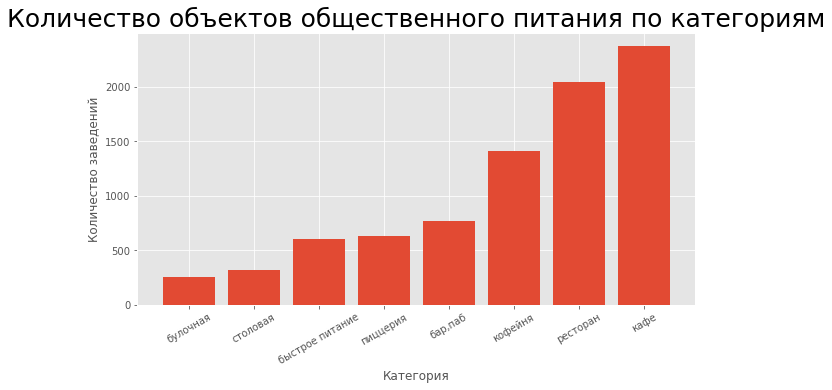

In [22]:

plt.figure(figsize=(10,5))
plt.bar(data=count_by_category,x='category',height='address')
plt.title("Количество объектов общественного питания по категориям",fontsize=25)
plt.xticks(rotation=30)
plt.ylabel('Количество заведений')
plt.xlabel('Категория')
plt.show()


In [23]:
fig = go.Figure(data=[go.Pie(labels=count_by_category['category'], values=count_by_category['address'])])
fig.update_layout(
    title="Количество объектов общественного питания по категориям",
        width=600,
    height=500,
)
fig.show() 

Чаще всего стречаются кафе - 28,3%. После идут рестораны - 24,3%, кофейни - 16,8%.

## Исследуйте количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Проанализируйте результаты и сделайте выводы.

In [24]:
count_seats_by_category = df.pivot_table(index='category',values='seats',aggfunc='median').sort_values('seats').reset_index()
count_seats_by_category

,category,seats
0,булочная,50.0
1,пиццерия,55.0
2,кафе,60.0
3,быстрое питание,65.0
4,столовая,75.5
5,кофейня,80.0
6,"бар,паб",82.5
7,ресторан,86.0


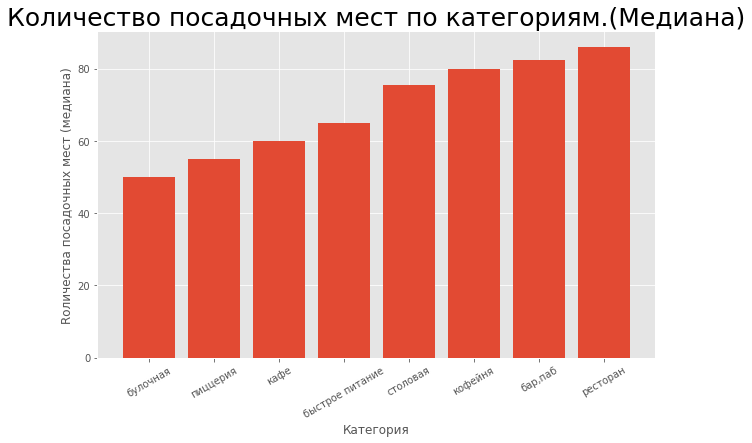

In [25]:

plt.figure(figsize=(10,6))
plt.bar(data=count_seats_by_category,x='category',height='seats')
plt.title("Количество посадочных мест по категориям.(Медиана)",fontsize=25)
plt.xticks(rotation=30)
plt.ylabel('Rоличества посадочных мест (медиана)')
plt.xlabel('Категория')
plt.show()

In [26]:
fig = go.Figure(data=[go.Pie(labels=count_seats_by_category['category'], 
                             values=count_seats_by_category['seats'],textinfo='value')])
fig.update_layout(
    title="Количество посадочных мест по категориям",
        width=500,
    height=500
)
fig.show()

Больше всего посадочных мест в ресторанах ~86 места, далее идут бары,пабы ~ 82.5 места, кофейни ~80 мест.

## Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?

In [27]:
by_chain = df.groupby('chain').agg({'name':'count'}).reset_index()
by_chain

,chain,name
0,0,5198
1,1,3205


In [28]:
fig = go.Figure(data=[go.Pie(labels=['Несетевые','Cетевые'], values=by_chain['name'])])
fig.update_layout(
    title="Количество сетевых и несетевых заведений",
        width=500,
    height=500,
)
fig.show()

Несетевых заведений больше.

## Какие категории заведений чаще являются сетевыми? Исследуйте данные и ответьте на вопрос графиком.

In [29]:
chain_cat = df.pivot_table(index='category',columns='chain',values='name',aggfunc='count').reset_index()
chain_cat.columns=['category','not_chain','chain']
chain_cat['percent'] = round(chain_cat['chain'] * 100 /( chain_cat['chain'] + chain_cat['not_chain'] ),2)
chain_cat

,category,not_chain,chain,percent
0,"бар,паб",596,169,22.09
1,булочная,99,157,61.33
2,быстрое питание,371,232,38.47
3,кафе,1598,779,32.77
4,кофейня,693,720,50.96
5,пиццерия,303,330,52.13
6,ресторан,1311,730,35.77
7,столовая,227,88,27.94


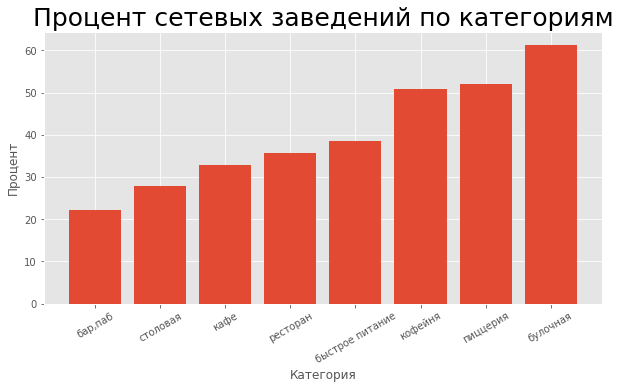

In [30]:

plt.figure(figsize=(10,5))
plt.bar(data=chain_cat.sort_values('percent'),x='category',height='percent')
plt.title("Процент сетевых заведений по категориям",fontsize=25)
plt.xticks(rotation=30)
plt.ylabel('Процент')
plt.xlabel('Категория')
plt.show()


Наиболее часто сетевыми заведениями являются булочные, пиццерии и кофейни.

<div class="alert alert-info"> 
<b>Комментарий студента_V2</b> 
    
Сделано
</div>

## Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. Постройте подходящую для такой информации визуализацию. Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся?

In [31]:
top_15 = df.query('chain == 1').groupby(['name']).agg({'address':'count'}).reset_index().sort_values(['address'],ascending=False).head(15)
top_15

,name,address
729,шоколадница,120
335,домино'с пицца,76
331,додо пицца,74
146,one price coffee,71
742,яндекс лавка,69
58,cofix,65
168,prime,50
664,хинкальная,44
409,кофепорт,42
418,кулинарная лавка братьев караваевых,39


In [32]:
names = top_15['name']
table1 = df.query('name in @names').pivot_table(index='name',columns=['category'],values='address',aggfunc='count')
table1.columns = ['бар,паб','булочная','питание','кафе','кофейня','пиццерия','ресторан','столовая']
table1

,"бар,паб",булочная,питание,кафе,кофейня,пиццерия,ресторан,столовая
name,,,,,,,,
cofefest,NaN,NaN,NaN,1.0,31.0,NaN,NaN,NaN
cofix,NaN,NaN,NaN,NaN,65.0,NaN,NaN,NaN
one price coffee,NaN,NaN,NaN,NaN,72.0,NaN,NaN,NaN
prime,NaN,NaN,NaN,1.0,NaN,NaN,49.0,NaN
буханка,NaN,25.0,NaN,1.0,6.0,NaN,NaN,NaN
додо пицца,NaN,NaN,NaN,NaN,NaN,74.0,NaN,NaN
домино'с пицца,NaN,NaN,NaN,NaN,NaN,77.0,NaN,NaN
кофепорт,NaN,NaN,NaN,NaN,42.0,NaN,NaN,NaN
кулинарная лавка братьев караваевых,NaN,NaN,NaN,39.0,NaN,NaN,NaN,NaN


In [33]:
top_15_category = table1.idxmax(axis="columns").value_counts()
top_15_category

кофейня     5
кафе        4
ресторан    3
пиццерия    2
булочная    1
dtype: int64

По таблице можно сказать, что 15 лучших сетей распределы по категориям так: 1 - булочная, 4 - кафе, 5 - кофеен,2 - пиццерии, 3 - ресторана.

In [34]:
table2 = df.query('name in @names').pivot_table(index='name',columns=['price'],values='address',aggfunc='count').reset_index(drop=True)
table2.columns=['высокие','выше среднего','низкие','средние']
table2

,высокие,выше среднего,низкие,средние
0,NaN,NaN,NaN,3.0
1,NaN,NaN,4.0,3.0
2,NaN,NaN,NaN,1.0
3,NaN,NaN,8.0,16.0
4,NaN,NaN,1.0,3.0
5,NaN,NaN,NaN,8.0
6,NaN,NaN,1.0,39.0
7,NaN,NaN,1.0,NaN
8,NaN,NaN,2.0,26.0
9,NaN,NaN,NaN,19.0


Большинство заведений по ценам относятся к "среднему" классу.

In [35]:
to_many_names = table2.sum()
to_many_names

высокие            2.0
выше среднего      6.0
низкие            23.0
средние          211.0
dtype: float64

In [36]:
fig = go.Figure(data=[go.Pie(labels=['высокие','выше среднего','низкие','средние'], values=[2,6,23,211],
                            textinfo='percent')])
fig.update_layout(
    title="Количество заведений по цене (Топ-15 сетей)",
            width=500,
    height=500
)

fig.show() 

<div class="alert alert-info"> 
<b>Комментарий студента_V1</b> 
    
Ниже
</div>

In [37]:
fig = go.Figure(data=[go.Pie(labels=top_15_category.index, values=top_15_category.values,
                            textinfo='value+percent')])
fig.update_layout(
    title="Количество заведений по категориям (Топ-15 сетей)",
    width=500,
    height=500
    
)

fig.show() 

## Какие административные районы Москвы присутствуют в датасете? Отобразите общее количество заведений и количество заведений каждой категории по районам. Попробуйте проиллюстрировать эту информацию одним графиком.

In [38]:
district_category = df.pivot_table(index='district',columns='category',values='name',aggfunc='count')
district_category['total'] = district_category.sum(axis=1)
district_category.sort_values('total')

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,total
district,,,,,,,,,
Северо-Западный административный округ,23,12,30,115,62,40,109,18,409
Юго-Западный административный округ,38,27,61,238,96,64,168,17,709
Юго-Восточный административный округ,38,13,67,282,89,55,145,25,714
Восточный административный округ,53,25,71,272,105,72,160,40,798
Западный административный округ,50,37,62,238,150,71,218,24,850
Северо-Восточный административный округ,63,28,82,269,159,68,181,40,890
Южный административный округ,68,25,85,264,131,73,202,44,892
Северный административный округ,68,39,58,235,193,77,188,41,899
Центральный административный округ,364,50,87,464,428,113,670,66,2242


<div class="alert alert-info"> 
<b>Комментарий студента_V2</b> 
    
Сделано
</div>

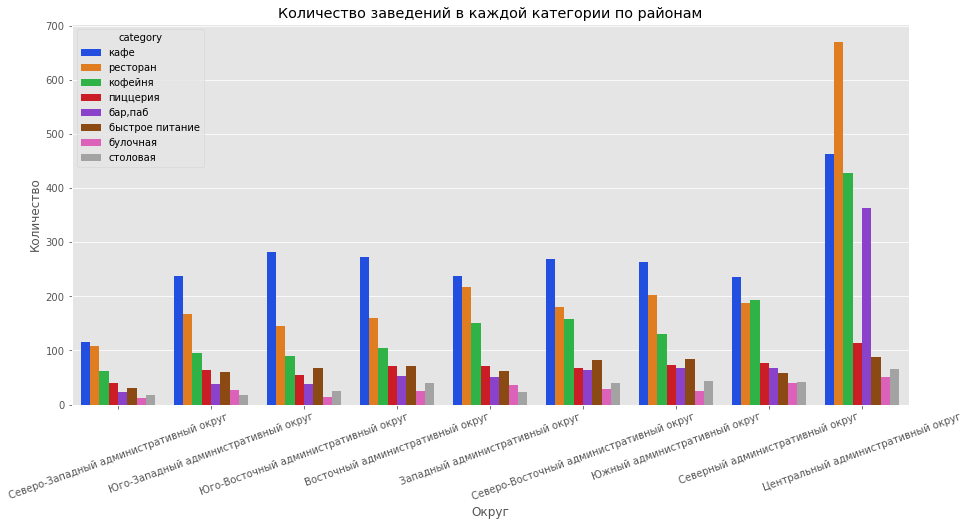

In [39]:
for_order = df['district'].value_counts().sort_values(ascending=True).index
plt.figure(figsize=(15,7))
sns.countplot(x='district',hue = 'category', data = df, palette = 'bright',order=for_order)
plt.title('Количество заведений в каждой категории по районам')
plt.xticks(rotation=20)
plt.xlabel('Округ')
plt.ylabel('Количество')
plt.show()

<div class="alert alert-info"> 
<b>Комментарий студента_V1</b> 
    
Отсортировано
</div>

В Центральном административном округе больше всего заведений.</br>
Во всех, кроме Центрального округа, наблюдается приблизительно равное соотношение заведений по категориям. Кафе => Ресторан => Кофейни

## Визуализируйте распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?

In [40]:
rating_category = df.pivot_table(index='category',values='rating',aggfunc=['median','mean']).reset_index()
rating_category.columns=['category','median','mean']
rating_category['mean'] = round(rating_category['mean'],2)
rating_category

,category,median,mean
0,"бар,паб",4.4,4.39
1,булочная,4.3,4.27
2,быстрое питание,4.2,4.05
3,кафе,4.2,4.12
4,кофейня,4.3,4.28
5,пиццерия,4.3,4.30
6,ресторан,4.3,4.29
7,столовая,4.3,4.21


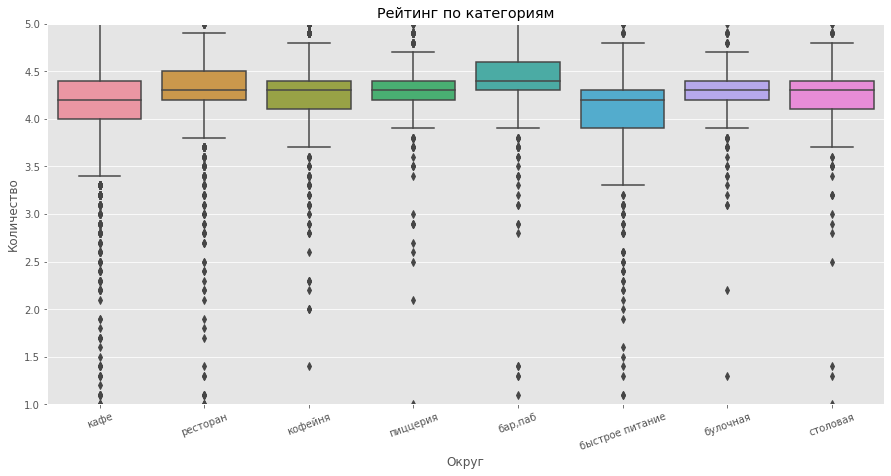

In [41]:
plt.figure(figsize=(15,7))
sns.boxplot(data=df,x='category',y='rating')
plt.title('Рейтинг по категориям')
plt.xticks(rotation=20)
plt.xlabel('Округ')
plt.ylabel('Количество')
plt.ylim(1,5)
plt.show()


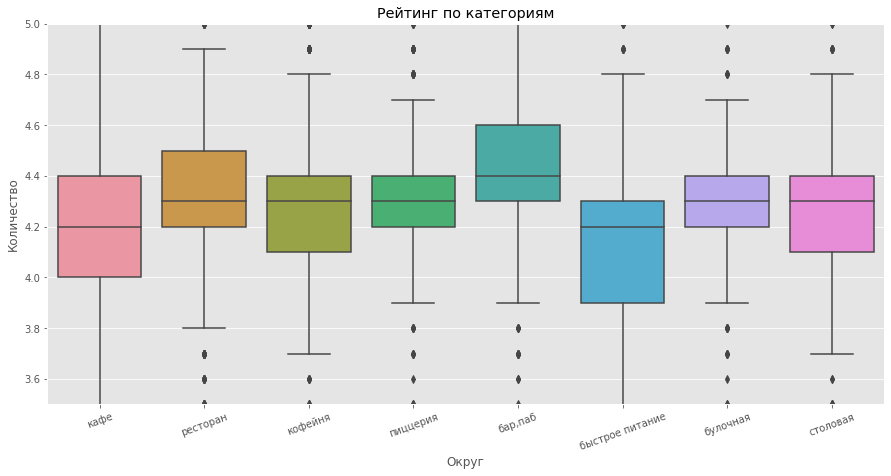

In [42]:
plt.figure(figsize=(15,7))
sns.boxplot(data=df,x='category',y='rating')
plt.title('Рейтинг по категориям')
plt.xticks(rotation=20)
plt.xlabel('Округ')
plt.ylabel('Количество')
plt.ylim(3.5,5)
plt.show()

<div class="alert alert-info"> 
<b>Комментарий студента_V2</b> 
    
Вопрос: Следует ли добавлять boxplot в презентацию в PowerPoint? Не все знают как интерпретировать такой график.
</div>

По медианному рейтингу лидируют бары, пабы - 4.4, все остальные категории, кроме быстрого питания и кафе(у которых 4.2), имеют рейтинг 4.3.

## Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson.

In [43]:
rating_df = df.groupby('district', as_index=False).agg({'rating':'mean'})
rating_df['rating'] = round(rating_df['rating'],2)
rating_df

,district,rating
0,Восточный административный округ,4.17
1,Западный административный округ,4.18
2,Северный административный округ,4.24
3,Северо-Восточный административный округ,4.15
4,Северо-Западный административный округ,4.21
5,Центральный административный округ,4.38
6,Юго-Восточный административный округ,4.10
7,Юго-Западный административный округ,4.17
8,Южный административный округ,4.18


<a id='first_review'></a>}

In [44]:
try:
    with open(r'C:\all\Study\Practicum\Module_3\admin_level_geomap.geojson',encoding='utf-8') as f:
        state_geo = json.load(f)
except:
    with open('/datasets/admin_level_geomap.geojson') as f:
        state_geo = json.load(f)
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.9,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

m

## Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [45]:
marker_cluster = MarkerCluster().add_to(m)
def create_marker(row):
    Marker([row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}"
    ).add_to(marker_cluster)

In [46]:
df.apply(create_marker,axis=1)

0       None
1       None
2       None
3       None
4       None
        ... 
8401    None
8402    None
8403    None
8404    None
8405    None
Length: 8403, dtype: object

In [47]:
m

<div class="alert alert-info"> 
<b>Комментарий студента_V1</b> 

Также поменял медианный рейтинг на средний.</br>
Средний рейтинг больше всего у Центрального округа, потом у Северного. Наименьший рейтинг у Юго-Восточного.

</div>

## Найдите топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам. Попробуйте проиллюстрировать эту информацию одним графиком.

In [48]:
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is24_7
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,Дыбенко,False
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,Дыбенко,False
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская,False
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,Маршала Федоренко,False
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная,False


In [49]:
by_street = df.groupby('street',as_index=False).agg({'name':'count'}).sort_values('name',ascending=False).head(15)
by_street

,street,name
729,Мира,183
982,Профсоюзная,123
223,Вернадского,108
606,Ленинский,108
603,Ленинградский,95
352,Дмитровское,88
484,Каширское,77
212,Варшавское,76
604,Ленинградское,70
643,МКАД,65


In [50]:
names=by_street['street']
top_15 = df.query('street in @names')
street_category = top_15.groupby(['street','category']).agg({'name':'count'})
street_category

name
street    category             
Вавилова  бар,паб             2
          булочная            2
          быстрое питание    11
          кафе               15
          кофейня            10
...                         ...
Пятницкая быстрое питание     2
          кафе                7
          кофейня             6
          пиццерия            3
          ресторан           18

[111 rows x 1 columns]

In [51]:
fig = px.bar(by_street.sort_values('name'), x='street', y='name',text='name')
fig.update_layout(
    title="Количество заведений на улицах",
    xaxis_title="Название улицы",
    yaxis_title="Количество заведений",
            width=1000,
    height=500
)

fig.update_xaxes(tickangle=-45)
fig.show() 

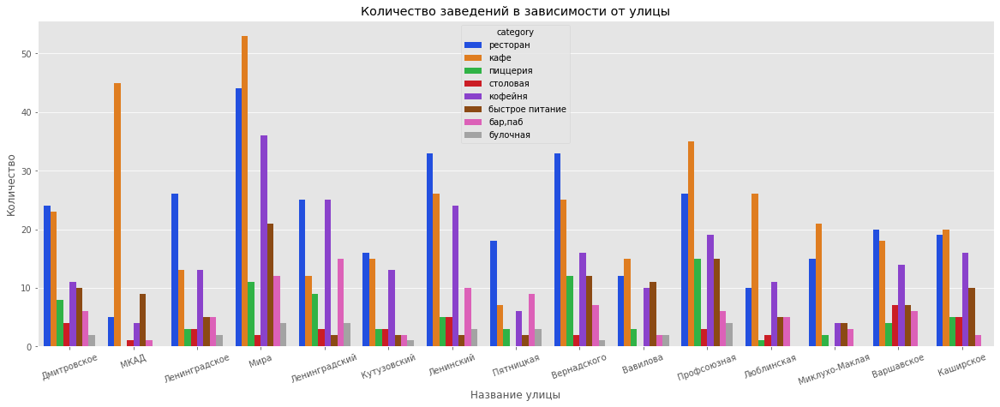

In [52]:
plt.figure(figsize=(20,7))
sns.countplot(x = 'street', hue = 'category', data = top_15, palette = 'bright')
plt.title('Количество заведений в зависимости от улицы')
plt.xticks(rotation=20)
plt.xlabel('Название улицы')
plt.ylabel('Количество')
plt.show()

<div class="alert alert-info"> 
<b>Комментарий студента_V1</b> 
    
Есть больщие улицы. В зависимости от их положения, на них могут доминировать совершенно разные категории заведений. Например: на МКАДе распологаются одни лишь кафе.
</div>

## Найдите улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?

In [53]:
only_one = df.groupby('street',as_index=False).agg({'name':'count'}).sort_values('name',ascending=False)
names_one = only_one.query('name == 1')['street']
len(names_one)

413

In [54]:
df.query('street in @names_one').groupby('category').agg({'name':'count'}).sort_values('name')

,name
category,
булочная,9
пиццерия,14
быстрое питание,20
столовая,32
"бар,паб",40
кофейня,79
ресторан,80
кафе,139


In [55]:
df.query('street in @names_one').groupby('district').agg({'name':'count'}).sort_values('name')

,name
district,
Юго-Западный административный округ,14
Северо-Западный административный округ,18
Юго-Восточный административный округ,35
Южный административный округ,36
Западный административный округ,40
Северный административный округ,41
Восточный административный округ,45
Северо-Восточный административный округ,50
Центральный административный округ,134


Не могу сделать какие-то выводы.

<div class="alert alert-info"> 
<b>Комментарий студента_V2</b> 
    
413 улиц на которых расположено только одно заведение. Чаще всего 'одинокими' бывают кафе.
</div>

## Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитайте медиану этого столбца для каждого района. Используйте это значение в качестве ценового индикатора района. Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируйте цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?

In [56]:
bill_district = df.groupby('district',as_index=False).agg({'middle_avg_bill':['median','count']})
bill_district.columns=['district','median','count']
bill_district.sort_values('median')

,district,median,count
6,Юго-Восточный административный округ,450.0,194
3,Северо-Восточный административный округ,500.0,301
8,Южный административный округ,500.0,314
0,Восточный административный округ,575.0,260
7,Юго-Западный административный округ,600.0,235
2,Северный административный округ,650.0,322
4,Северо-Западный административный округ,700.0,157
1,Западный административный округ,1000.0,306
5,Центральный административный округ,1000.0,1060


In [57]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=bill_district,
    columns=['district', 'median'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианное значение чека',
).add_to(m)
m

В Центральном и Западном округах самые высокие цены. Чем ближе к центру города, тем будут больше цены. Также влияет сам округ (какие-то округа более бюджетные, какие-то более дорогие) </br>

## Разбивка среднего чека по категории.

In [58]:
avg_cat = df.groupby('category',as_index=False).agg({'middle_avg_bill':'median'})
avg_cat = avg_cat.sort_values('middle_avg_bill')
avg_cat

,category,middle_avg_bill
7,столовая,300.0
2,быстрое питание,375.0
4,кофейня,400.0
1,булочная,450.0
3,кафе,550.0
5,пиццерия,600.0
0,"бар,паб",1250.0
6,ресторан,1250.0


In [59]:
fig = px.bar(avg_cat, x='category', y='middle_avg_bill',text='middle_avg_bill')
fig.update_layout(
    title="Медианный чек",
    xaxis_title="Категория",
    yaxis_title="Сумма чека",
    
            width=1000,
    height=500

)
fig.show() 

<div class="alert alert-info"> 
<b>Комментарий студента_V2</b> 
    
Сделано
</div>

## Соберите наблюдения по вопросам выше в один общий вывод.

Разделение заведений по категориям в Москве следующее: больше всего кафе - 28.3%, рестораны - 24.3%, кофейни - 16.8%. </br>
Несетевых заведений больше, чем сетевых 61.9% против 38.1%. </br>
Разделение сетевых заведений по категориям: топ 3 остался тот же кафе - 24.3%, рестораны - 22.8%, кофейни - 22.5%.</br>
В топ-15 по количеству заведений сетей входят: 6 кофеен, 3 кафе, 3 ресторана, 2 пиццерии, 1 булочная. </br>
Причём в 87% заведений, относящихся к сетям из топ-15, установлен "средний уровень" цен. </br>
Наибольшее количество заведений находится в Центральном административном округе. Во всех округах, кроме Центрального, примерно равное соотношение заведений по категориям: Кафе -> ресторан -> кофейня. В Центральном же округе по количеству лидируют Рестораны -> кафе-> кофейни-> бары,пабы. </br>
По медианному рейтингу лидируют бары и пабы, медианный рейтинг этой категории составляет 4.4, после чего идут булочные,кофейни,пиццерии,рестораны,столовые с рейтингом 4.3, далее кафе и быстрое питание - 4.2.</br>
Если посмотреть на рейтинг в разбивке по округам, то лидирует Центральный с рейтингом 4.4. Северо-Восточный и Юго-Восточный имеют рейтинг 4.2, остальные округа - 4.3.</br>
По округам, наибольшую цену медианного чека делят Центральный и Западный округа, медианное значение чека составляет 1000 рублей. </br>
По категориям средний чек: Бары и пабы, рестораны - первые места, 1250 

[Обратно к Оглавлению](#home)
<a id="fourth_step"></a> 
# Шаг 4. Детализируем исследование: открытие кофейни.

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуйте определить, осуществима ли мечта клиентов.

## Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

In [60]:
df['category'].value_counts()

кафе               2377
ресторан           2041
кофейня            1413
бар,паб             765
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: category, dtype: int64

Всего в Москве 1413 кофейни.

In [61]:
coffee_district = df.query('category == "кофейня"').groupby('district',as_index=False).agg({'name':'count'})
coffee_district = coffee_district.sort_values('name')
coffee_district

,district,name
4,Северо-Западный административный округ,62
6,Юго-Восточный административный округ,89
7,Юго-Западный административный округ,96
0,Восточный административный округ,105
8,Южный административный округ,131
1,Западный административный округ,150
3,Северо-Восточный административный округ,159
2,Северный административный округ,193
5,Центральный административный округ,428


In [62]:
fig = px.bar(coffee_district, x='name', y='district',text='name')
fig.update_layout(
    title="Количество кофеен в зависимости от округа",
    xaxis_title="Округ",
    yaxis_title="Количество",
    height = 500,
    width = 1000
)
fig.update_xaxes(tickangle=-45)
fig.show() 

<div class="alert alert-info"> 
<b>Комментарий студента_V2</b> 
    
Сделано
</div>

<a id ='coffee_shop_by_district'> </a>

In [63]:
fig = go.Figure(data=[go.Pie(labels=coffee_district['district'], values=coffee_district['name'],
                            textinfo='percent')])
fig.update_layout(
    title="Процент от общего количества кофеен в зависимости от округа",
    width = 1000,
    height = 500
)

fig.show() 

In [64]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=coffee_district,
    columns=['district', 'name'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=1,
    legend_name='Количество кофеен',
).add_to(m)
m

Треть кофеен находится в Центральном округе. Потом идут Северный, Северо-Восточный, Западный округи.

## Есть ли круглосуточные кофейни?

In [65]:
coffee_shop = df.query('category == "кофейня"')

In [66]:
coffee_shop['is24_7'].value_counts()

False    1354
True       59
Name: is24_7, dtype: int64

In [67]:
ar_clock = coffee_shop.pivot_table(index='district',columns='is24_7',values='name',aggfunc='count').reset_index()
ar_clock.columns=['district','no','yes']
ar_clock['total'] = ar_clock['yes'] + ar_clock['no']
ar_clock['percent'] = round(ar_clock['yes'] / ar_clock['total'],2)
ar_clock = ar_clock.sort_values('percent')
ar_clock

,district,no,yes,total,percent
6,Юго-Восточный административный округ,88,1,89,0.01
8,Южный административный округ,130,1,131,0.01
3,Северо-Восточный административный округ,156,3,159,0.02
2,Северный административный округ,188,5,193,0.03
4,Северо-Западный административный округ,60,2,62,0.03
0,Восточный административный округ,100,5,105,0.05
1,Западный административный округ,141,9,150,0.06
5,Центральный административный округ,402,26,428,0.06
7,Юго-Западный административный округ,89,7,96,0.07


In [68]:
fig = px.bar(ar_clock.sort_values('yes'), x='district', y='yes',text='yes')
fig.update_layout(
    title="Круглосуточные кофейни по округам",
    xaxis_title="Округ",
    yaxis_title="Количество",
    width = 1000,
    height = 500
)
fig.update_xaxes(tickangle=-45)
fig.show() 

In [69]:
fig = px.bar(ar_clock, x='district', y='percent',text='percent')
fig.update_layout(
    title="Доля круглосуточных кофеен в каждом округе",
    xaxis_title="Округ",
    yaxis_title="Количество",
    width = 1000,
    height = 500
)
fig.update_xaxes(tickangle=-45)
fig.show() 

На первой столбчатой диаграмме показано абсолютное количество кофеен по округам. На второй - доля круглосутчных кофеен в каждом оркуге. (Не от общего числа). </br>
По абсолютному показателю лидирует Центральный. По доле - Юго-Западный.

<div class="alert alert-info"> 
<b>Комментарий студента_V2</b> 
    
Сделано
</div>

## Какие у кофеен рейтинги? Как они распределяются по районам?

In [70]:
coffee_rating = coffee_shop.pivot_table(index='district',values='rating',aggfunc='median').reset_index()
coffee_rating = coffee_rating.sort_values('rating')
coffee_rating

,district,rating
1,Западный административный округ,4.2
0,Восточный административный округ,4.3
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.3
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.3
6,Юго-Восточный административный округ,4.3
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3


Во всех округах, кроме Западного (рейтинг 4.2), рейтинг 4.3.

## На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [71]:
coffee_price = coffee_shop.pivot_table(index='district',values='middle_coffee_cup',aggfunc='median').reset_index().sort_values('middle_coffee_cup')
coffee_price

,district,middle_coffee_cup
0,Восточный административный округ,135.0
6,Юго-Восточный административный округ,147.5
8,Южный административный округ,150.0
2,Северный административный округ,159.0
3,Северо-Восточный административный округ,162.5
4,Северо-Западный административный округ,165.0
1,Западный административный округ,189.0
5,Центральный административный округ,190.0
7,Юго-Западный административный округ,198.0


In [72]:
coffee_shop['middle_coffee_cup'].median()

170.0

In [73]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=coffee_price,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианное значение чашки кофе',
).add_to(m)
m

Медианное значение по всей Москве - 170 рублей за чашку, хоть и значение разница в зависимости от округа, рекомендую ориентироваться на 170.

## Постройте визуализации. Попробуйте дать рекомендацию для открытия нового заведения. Это творческое задание: здесь нет правильного или неправильного ответа, но ваше решение должно быть чем-то обосновано. Объяснить свою рекомендацию можно текстом с описанием или маркерами на географической карте.

Средний чек в кофейнях в разбике по округу.

In [74]:
coffee_avg_price = coffee_shop.groupby('district',as_index=False).agg({'middle_avg_bill':['median','count']})
coffee_avg_price.columns=['district','median','count']
coffee_avg_price = coffee_avg_price.sort_values('median')
coffee_avg_price

,district,median,count
6,Юго-Восточный административный округ,250.0,10
2,Северный административный округ,325.0,19
3,Северо-Восточный административный округ,325.0,19
4,Северо-Западный административный округ,325.0,11
7,Юго-Западный административный округ,375.0,11
8,Южный административный округ,387.5,18
0,Восточный административный округ,400.0,9
5,Центральный административный округ,500.0,85
1,Западный административный округ,600.0,18


In [75]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=coffee_avg_price,
    columns=['district', 'median'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.9,
    legend_name='Медианное значение чека',
).add_to(m)
m

Средний чек по кофейням. Следует учесть, что для некоторых округов очень мало данных в этом столбце. Получилось, что в Западном округе цена больше, чем в Центральном.

## Какой процент кофеен относится к сетям из топ-15.

In [76]:
top_15 = df.query('chain == 1').groupby(['name']).agg({'address':'count'}).reset_index().sort_values(['address'],ascending=False).head(15)
top_15 = top_15['name']
count_coffee_total = len(coffee_shop.query('chain == 1'))
count_coffee_chain_top = len(coffee_shop.query('name in @top_15'))

fig = go.Figure(data=[go.Pie(labels=['Не входит в топ-15','Входит в топ-15'], values=[count_coffee_total-count_coffee_chain_top,count_coffee_chain_top],
                            textinfo='percent')])
fig.update_layout(
    title="Процент от всех сетевых кофеен, входящих в лучшие 6 сетевых кофеен."
)

fig.show() 

In [77]:
count_coffee_chain_top

337

Почти половина сетевых кофеен относится к лучшим 15 заведниям (или 6 лучшим кофейным франшизам.)

In [78]:
one_more_table = coffee_shop.groupby("price").agg({'name':'count','middle_avg_bill':'median','middle_coffee_cup':"median"})
one_more_table.columns=['Количество кофеен','Медианная цена чека','Медианна цена чашки кофе']
one_more_table.sort_values('Медианная цена чека',ascending=False)

,Количество кофеен,Медианная цена чека,Медианна цена чашки кофе
price,,,
высокие,17,2000.0,NaN
выше среднего,14,1250.0,256.0
средние,377,400.0,200.0
низкие,68,145.5,139.0


Выделю из округов наиболее благоприятный - с наименьшим количеством конкурентов, с наибольшим чеком за чашку кофе. </br>
Самые большие чеки за кофе в следующих районах: Центральном, Западном, Юго-Западном.</br>
Теперь посмотрим [сюда](#coffee_shop_by_district). </br>
На Центральный округ приходится целых 30% кофеен от общего количества. Этот вариант рассматривать не буду.</br>
Западный округ - 10.6% или 150 кофеен. Юго-Западный округ - 6.8% или 96 кофеен. </br>
Юго-Западный находится на 3-м с конца месте по количеству кофеен.
ПО стоимости чека: Западный округ - 600 рублей, Юго-Западный: 375 рублей.  </br>
По стоимости чашки кофе: Западный - 189 рубелй, Юго-Западный 198 рублей. </br>
</p>
Рекомендую рассмотреть 2 округа: Западный и Юго-Западный. В Западном больше заведений, но и средняя цена чека в кофейне больше почти в 2 раза, чем в Юго-Западном. Зато в Юго-Западном меньше заведений, но цена чека также меньше. Если смотреть по стоимости чашки кофе, то они почти не различаются.

<div class="alert alert-info"> 
<b>Комментарий студента_V2</b> 

Добавил, поправил : https://docs.google.com/presentation/d/1VPQPeTrpPpB3ZFi1ZP0B8G8IDE1Dbvyv/edit?usp=sharing&ouid=118091232226175939124&rtpof=true&sd=true
</div>

[Обратно к Оглавлению](#home)
<a id="fifth_step"></a> 
# Шаг 5. Подготовка презентации

Презентация: https://docs.google.com/presentation/d/1kOV5NXevfdn2LiYf4TLjtuPQLYL6Z4NP/edit?usp=sharing&ouid=118091232226175939124&rtpof=true&sd=true